In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import geopandas as gpd
import shapely
import fiona
from shapely.geometry import Point, LineString, Polygon
from shapely import wkt
import contextily as cx
import mapclassify

Phibsborough Schools Boudning Box Coordinates:
(53.368166, -6.282090)
(53.349541, -6.257952)

In [3]:
rawdata = pd.read_csv("google_airview/airview_dublincity_measurements_ugm3.csv")

In [4]:
rawschools= pd.read_csv('schools_screening/screening_phibsborough_schools.csv')
rawschools = rawschools.dropna(subset='name')
rawschools['road_id'] = rawschools['road_id'].astype(int)

In [5]:
# defining data bounding range (coordinates)
xmin= -6.282610
xmax= -6.25795
ymin= 53.349541
ymax= 53.368166

In [6]:
data = rawdata[(ymin<rawdata.latitude) & (rawdata.latitude<ymax) & (rawdata.longitude<xmax) & (rawdata.longitude>xmin)]
data = data[data.NO2_ugm3<200]
data = data.reset_index()
data = data.drop(columns=['O3_ugm3', 'CO_mgm3', 'CO2_mgm3', 'PMch1_perL', 'PMch2_perL',
       'PMch3_perL', 'PMch4_perL', 'PMch5_perL', 'PMch6_perL','index'])
data['gps_timestamp'] = pd.to_datetime(data['gps_timestamp'])

In [7]:
ndata = len(data)
maxdata = np.max(data.NO2_ugm3)
mindata = np.min(data.NO2_ugm3)

In [8]:
# converting bounded data to gdf
geometry = [Point(xy) for xy in zip(data['longitude'], data['latitude'])]
datagdf = gpd.GeoDataFrame(data, crs='epsg:4326', geometry=geometry)

In [9]:
#convert schools to gdf
geometry = [Point(xy) for xy in zip(rawschools['longitude'], rawschools['latitude'])]
schools = gpd.GeoDataFrame(rawschools, crs='epsg:4326', geometry=geometry)

## GIS

In [10]:
datagdf['hour'] = [t.hour for t in datagdf['gps_timestamp']]
datagdf['dayofweek'] = [t.day_of_week for t in datagdf['gps_timestamp']]
datagdf['month'] = [t.month for t in datagdf['gps_timestamp']]

In [11]:
rawroad = gpd.read_file('google_airview/airview_dublincity_roaddata_ugm3/AirView_DublinCity_RoadData_ugm3.shp')

In [12]:
road = rawroad[rawroad['NO2_ugm3']<100]
road = road[road['NO2drives']>10]
road = road.reset_index()
road = road.drop(columns=['NOpoints','NOdrives', 'NO_ugm3', 'CO2points', 'CO2drives', 'CO2_mgm3', 'COpoints',
       'COdrives', 'CO_mgm3', 'O3points', 'O3drives', 'O3_ugm3','index'])
road['road_id'] = road['road_id'].astype(int)

In [13]:
boundroad = road.cx[xmin:xmax, ymin:ymax]
boundroad = boundroad.reset_index().drop(columns=['index'])

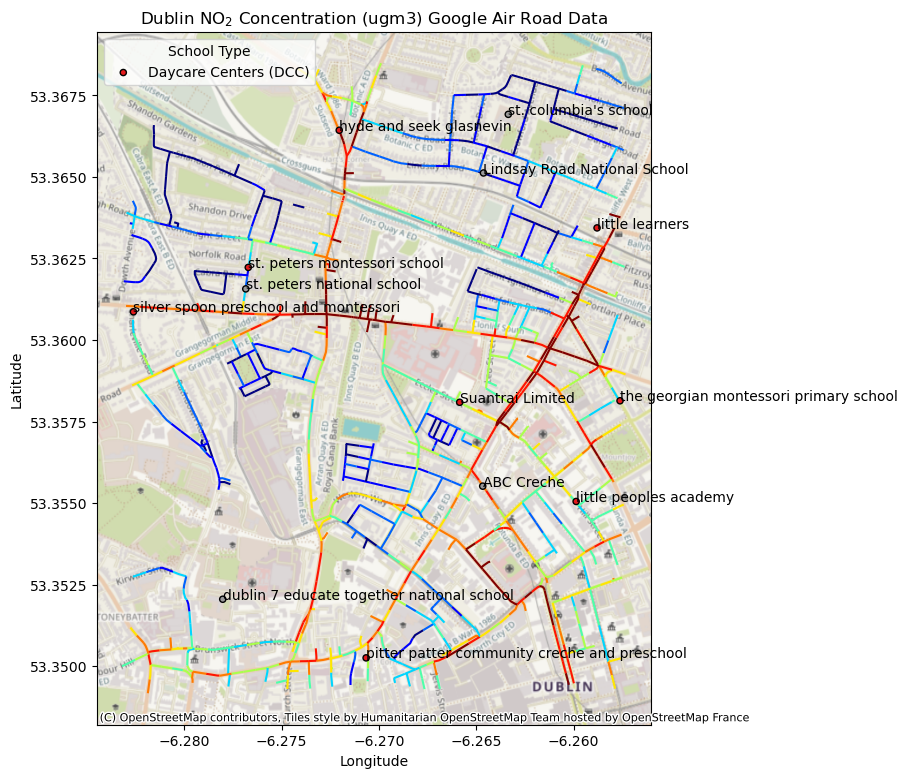

In [247]:
ax = boundroad.plot(column="NO2_ugm3", scheme="QUANTILES", figsize=(15,9), k=10, cmap='jet',zorder=1, legend=False, label='_nolegend_')
cx.add_basemap(ax, crs=road.crs)
schools.plot(ax=ax, column="school_type", cmap="Set1", categorical=True, zorder=2, marker="o", markersize=20, edgecolors="black", legend=True)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title("Dublin NO$_{2}$ Concentration (ugm3) Google Air Road Data")
# fix legend
ax.legend(labels=['Daycare Centers (DCC)', 'National Schools (NS)'], title='School Type', loc='upper left')
for x, y, name in zip(schools.geometry.x, schools.geometry.y, schools.name):
    ax.annotate(name, xy=(x, y))

In [21]:
road.explore(column="NO2_ugm3", scheme="QUANTILES", k=10, legend=True, cmap='jet')

In [14]:
ax = boundroad.explore(column="NO2_ugm3", scheme="QUANTILES", k=10, legend=True, cmap='jet')

schools.explore(
     m=ax,  # pass the map object
    color="black",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
#     tooltip="name",  # show "name" column in the tooltip
#     tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="schools",  # name of the layer in the map
)

In [15]:
np_data = datagdf.bounds[['minx', 'miny']].to_numpy()
np_road = boundroad['geometry'].bounds.to_numpy()

In [16]:
# approximation of points to their nearest road
# (1) some points not "snapped" to some roads (assigned -1), (2) some roads also do not have data points
nearest_rd = np.empty(ndata)
nearest_rd.fill(-1)
for rd_id in range(len(np_road)):
    rd = np_road[rd_id]
    rd[[0,1]] = rd[[0,1]]-0.00001 # increasing range a bit to account for sidewalk, approximation
    rd[[2,3]] = rd[[2,3]]+0.00001
    mask = ((np_data >= rd[[0,1]]) & (np_data <= rd[[2, 3]])).all(axis=1)
    nearest_rd[mask] = rd_id

In [17]:
# dict data structure to match index with road id
road_id_dict = boundroad['road_id'].to_dict()
road_id_dict[-1] = -1

In [18]:
def vec_translate(df, my_dict):    
    return np.vectorize(my_dict.__getitem__)(df)

In [19]:
datagdf['road_id'] = vec_translate(nearest_rd, road_id_dict)

Text(0.5, 0.93, 'NO2 ugm3 Concentration Distribution near Schools')

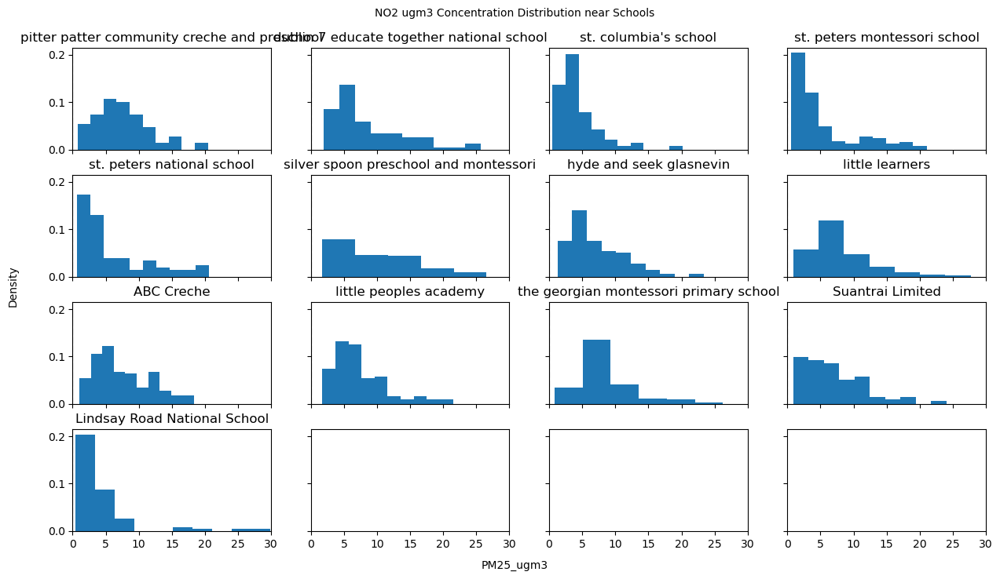

In [22]:
# normal plot for all stretches of road of interest
nrows=4
ncols=4
fig, axs = plt.subplots(nrows, ncols, figsize=(15,8), sharey=True, sharex=True)
fig.subplots_adjust(hspace=0.25)
for i, ax, name in zip(range(len(schools)), axs.flatten(), schools.name):
    # subset data from school's road id
    road_id = schools.iloc[i]['road_id'] 
    dataoi = datagdf[datagdf['road_id'] == road_id]
    ax.hist(dataoi['PM25_ugm3'], density=1)
    ax.set_title(f"{name}")
    ax.axvline(x=0, color="grey", linestyle="--")
    ax.axvline(x=100, color="grey", linestyle="--")
    ax.set_xlim(0,30)
fig.text(0.5, 0.05, 'PM25_ugm3', ha='center')
fig.text(0.07, 0.5, 'Density', va='center', rotation='vertical')
fig.text(0.5, 0.93, "NO2 ugm3 Concentration Distribution near Schools", ha='center')

Text(0.5, 0.93, 'Time of Day vs NO2 ugm3 Concentration near Schools')

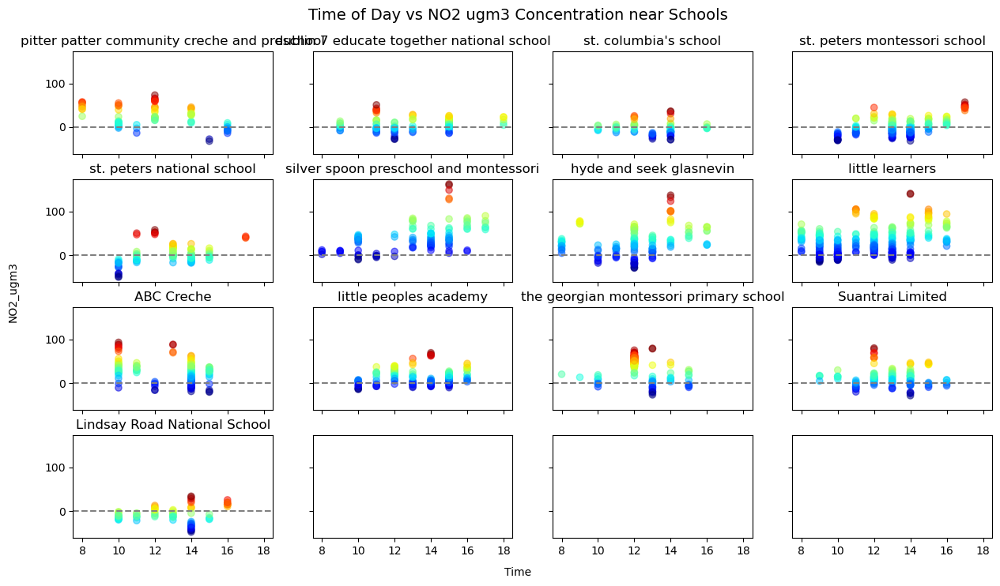

In [23]:
# normal plot for all stretches of road of interest
nrows=4
ncols=4
fig, axs = plt.subplots(nrows, ncols, figsize=(15,8), sharey=True, sharex=True)
fig.subplots_adjust(hspace=0.25)
for i, ax, name in zip(range(len(schools)), axs.flatten(), schools.name):
    road_id = schools.iloc[i]['road_id'] 
    dataoi = datagdf[datagdf['road_id'] == road_id]
    ax.scatter(dataoi['hour'], dataoi['NO2_ugm3'], alpha=0.5, c=dataoi['NO2_ugm3'], cmap='jet')
    ax.set_title(f"{name}")
#     ax.text(0, 0.05, f"Count: {len(dataoi)}", ha='right')
    ax.axhline(y=0, color="grey", linestyle="--")
fig.text(0.5, 0.05, 'Time', ha='center')
fig.text(0.07, 0.5, 'NO2_ugm3', va='center', rotation='vertical')
fig.text(0.5, 0.93, "Time of Day vs NO2 ugm3 Concentration near Schools", ha='center', fontsize=14)

Text(0.5, 0.93, 'Month vs NO2 ugm3 Concentration near Schools')

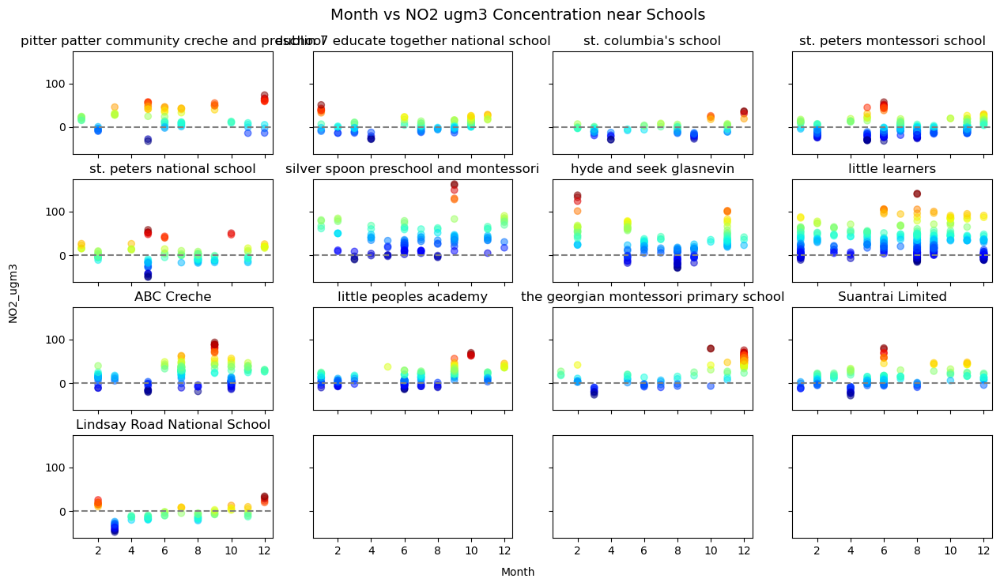

In [24]:
# normal plot for all stretches of road of interest
nrows=4
ncols=4
fig, axs = plt.subplots(nrows, ncols, figsize=(15,8), sharey=True, sharex=True)
fig.subplots_adjust(hspace=0.25)
for i, ax, name in zip(range(len(schools)), axs.flatten(), schools.name):
    road_id = schools.iloc[i]['road_id'] 
    dataoi = datagdf[datagdf['road_id'] == road_id]
    ax.scatter(dataoi['month'], dataoi['NO2_ugm3'], alpha=0.5, c=dataoi['NO2_ugm3'], cmap='jet')
    ax.set_xlim([0.5, 12.5])
#     ax.text(0, 0.05, f"Count: {len(dataoi)}", ha='right')
    ax.axhline(y=0, color="grey", linestyle="--")
    ax.set_title(f"{name}")
fig.text(0.5, 0.05, 'Month', ha='center')
fig.text(0.07, 0.5, 'NO2_ugm3', va='center', rotation='vertical')
fig.text(0.5, 0.93, "Month vs NO2 ugm3 Concentration near Schools", ha='center', fontsize=14)

In [246]:
# looking at each school's data
i = 5
rd_id = schools.iloc[i]['road_id']
dataoi = datagdf[datagdf['road_id'] == road_id]

name                              silver spoon preschool and montessori
drive_passes                                                       40.0
road_id                                                         3716558
sitecode                                                            NaN
address               41 Charleville Rd, Phibsborough, Dublin 7, D07...
latitude                                                      53.360865
school_type                                                         0.0
longitude                                                     -6.282609
on_road                                                             0.0
nearest_road                                              Charlville Rd
concentration_type                                          medium-high
drive_passes.1                                                      NaN
concentration                                               13.79-25.84
direction                                                       